In [1]:
import pandas as pd
import lasio
# Plotly Imports
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [2]:
df = lasio.read('/Users/isaacabrahamodeh/Desktop/Taranaki-wells/Taranaki/maui-2_final.las').df()

In [3]:
df.reset_index(inplace=True)

In [4]:
df.head()

,DEPTH,BS,CALI,DENS,DRHO,DTC,GR,NEUT,RESD,RESS,SP
0,326.5932,15.0,NaN,NaN,NaN,NaN,24.6674,NaN,NaN,1.9753,NaN
1,326.7456,15.0,NaN,NaN,NaN,NaN,24.3252,NaN,NaN,1.9704,NaN
2,326.8980,15.0,NaN,NaN,NaN,NaN,23.9830,NaN,NaN,1.9656,NaN
3,327.0504,15.0,NaN,NaN,NaN,NaN,23.7655,NaN,NaN,1.9561,-10.5412
4,327.2028,15.0,NaN,NaN,NaN,NaN,23.8004,NaN,NaN,1.9372,-10.6178


In [5]:
df.describe()

,DEPTH,BS,CALI,DENS,DRHO,DTC,GR,NEUT,RESD,RESS,SP
count,21255.000000,21233.000000,4304.000000,7003.000000,6956.000000,21197.000000,21241.000000,4284.000000,21188.000000,18750.000000,21235.000000
mean,1946.148000,11.016610,8.744006,2.402665,0.021826,103.512969,55.945820,0.216262,7.890186,4.835990,-41.000213
std,935.116391,2.399191,1.318880,0.122277,0.032565,31.239089,11.597948,0.068617,72.853063,8.893605,31.317866
min,326.593200,8.500000,7.221200,1.954900,-0.028680,47.005400,-4.000000,0.061020,0.621900,0.814200,-110.074500
25%,1136.370600,8.500000,7.838725,2.305400,0.002540,80.840000,49.658200,0.171935,1.296475,2.194725,-72.352450
50%,1946.148000,10.625000,8.260850,2.398100,0.012990,92.742200,58.444500,0.222605,2.192000,3.861350,-33.456400
75%,2755.925400,10.625000,9.106725,2.496400,0.032463,122.406800,63.729200,0.248825,3.644900,5.382100,-13.305600
max,3565.702800,15.000000,14.601300,2.721500,0.223790,205.729000,353.421400,0.479650,2000.000000,143.831900,16.469700


## Plotly Graph Objects
Low level interface for creating interactive figures, adding traces traces and creating layouts

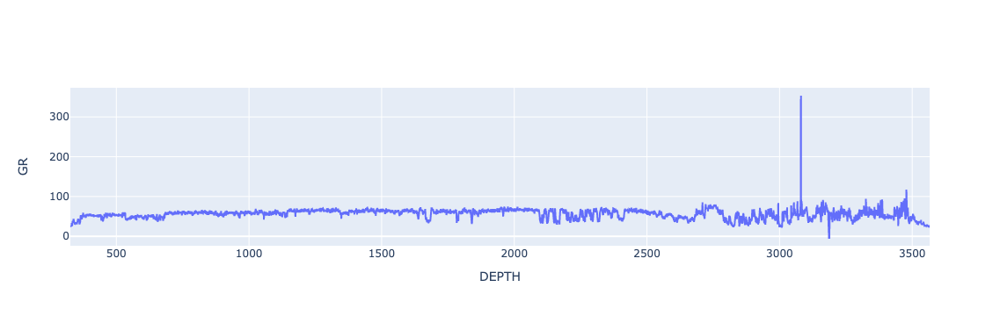

In [6]:
fig = go.Figure(data=go.Scatter(x=df['DEPTH'], y=df['GR']))
fig.update_layout(xaxis_title='DEPTH', yaxis_title='GR')
fig.show()

## Plotly Express
High level wrapper around plotly, that allows users to interact with plotly using easier to use syntax

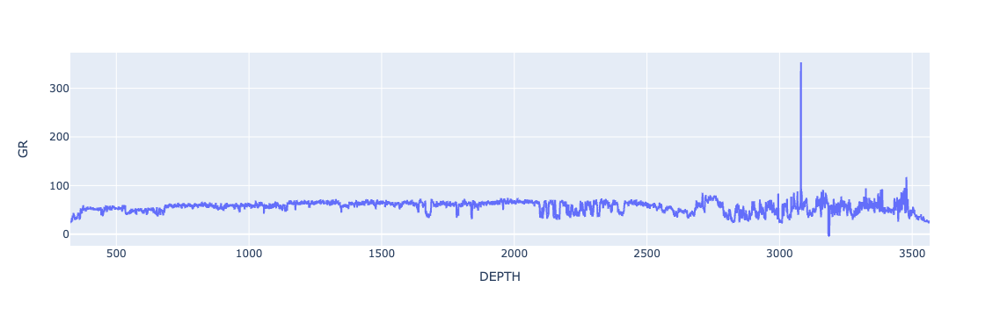

In [8]:
fig = px.line(df, x='DEPTH', y='GR')
fig.show()

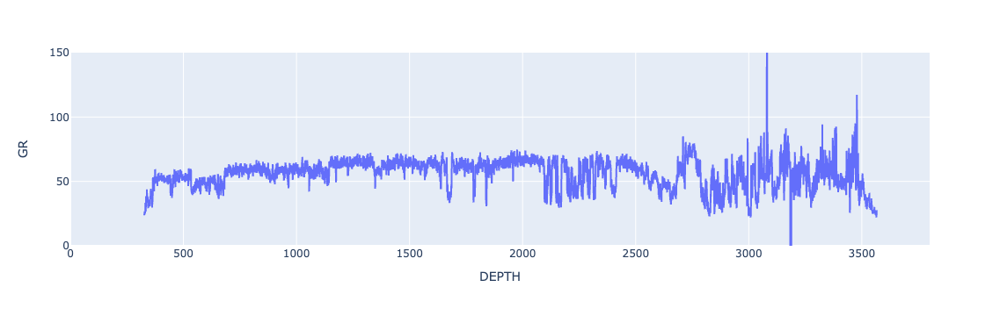

In [9]:
fig = px.line(df, x='DEPTH', y='GR', 
              range_y=[0, 150], 
              range_x=[0,3800])
fig.show()

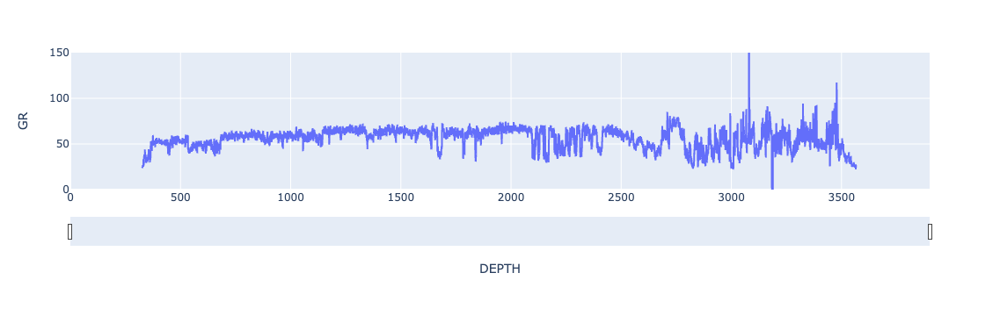

In [10]:
fig = px.line(df, x='DEPTH', y='GR', 
              range_y=[0, 150], 
              range_x=[0,3900])
fig.update_xaxes(rangeslider_visible=True)
fig.show()

## Creating Log Plots with make_subplots()

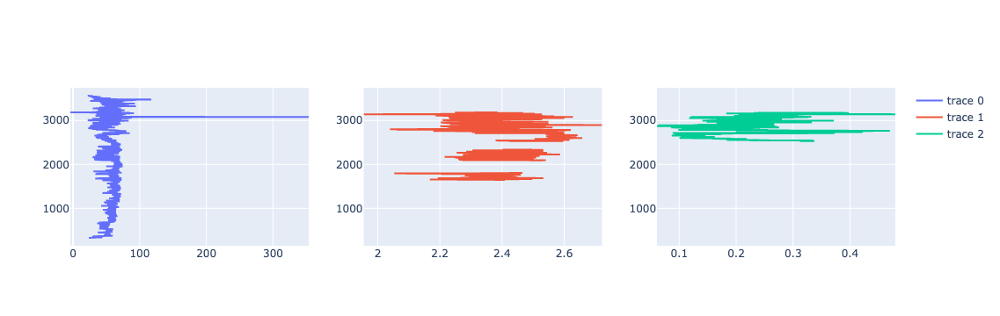

In [11]:
fig = make_subplots(rows=1, cols=3, )
fig.add_trace(go.Scatter(x=df['GR'], y=df['DEPTH']), row=1, col=1)
fig.add_trace(go.Scatter(x=df['DENS'], y=df['DEPTH']), row=1, col=2)
fig.add_trace(go.Scatter(x=df['NEUT'], y=df['DEPTH']), row=1, col=3)



fig.show()

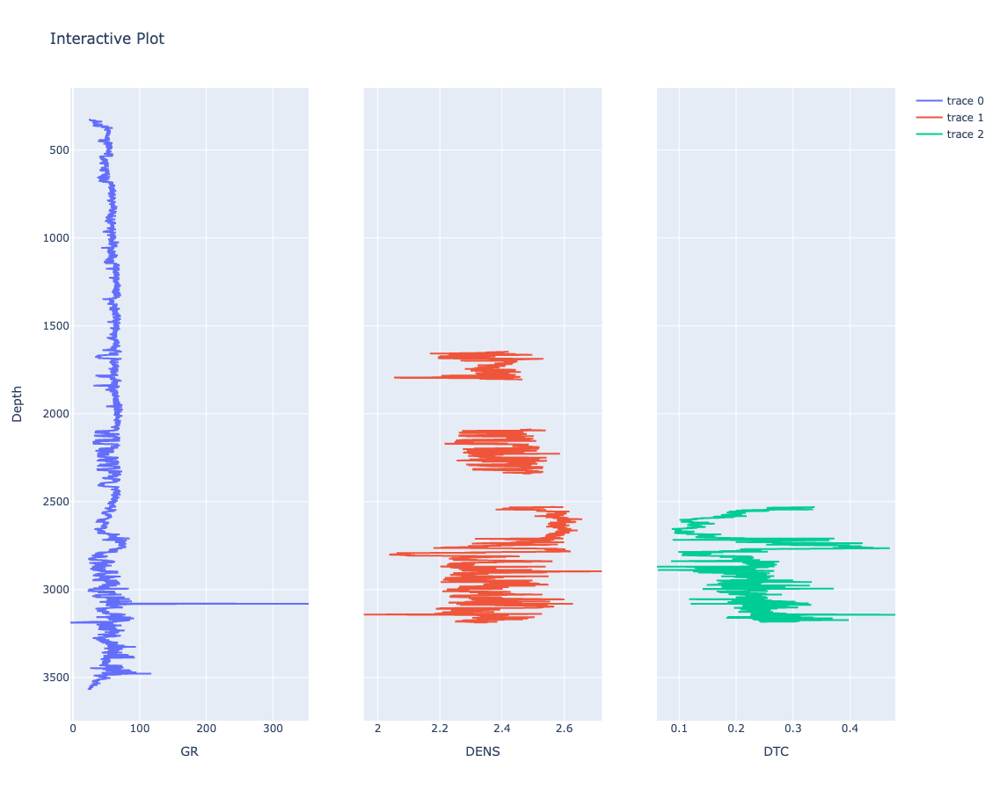

In [12]:
fig = make_subplots(rows=1, cols=3, shared_yaxes=True)
fig.add_trace(go.Scatter(x=df['GR'], y=df['DEPTH']), row=1, col=1)
fig.add_trace(go.Scatter(x=df['DENS'], y=df['DEPTH']), row=1, col=2)
fig.add_trace(go.Scatter(x=df['NEUT'], y=df['DEPTH']), row=1, col=3)

fig.update_xaxes(title_text="GR", row=1, col=1)
fig.update_xaxes(title_text="DENS", row=1, col=2)
fig.update_xaxes(title_text="DTC", row=1, col=3)


fig.update_yaxes(title_text="Depth", row=1, col=1, autorange='reversed')

fig.update_layout(title_text="Interactive Plot", height=900)

fig.show()

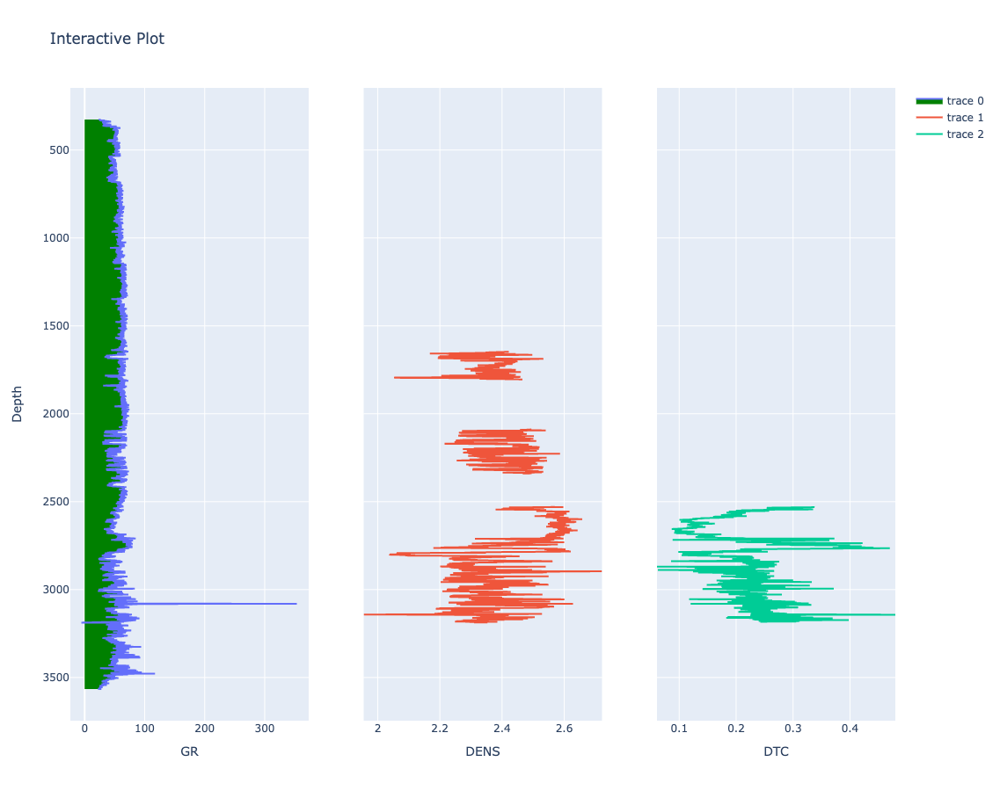

In [14]:
fig = make_subplots(rows=1, cols=3, shared_yaxes=True)
fig.add_trace(go.Scatter(x=df['GR'], y=df['DEPTH'], fill='tozerox', fillcolor='green'), row=1, col=1)
fig.add_trace(go.Scatter(x=df['DENS'], y=df['DEPTH']), row=1, col=2)
fig.add_trace(go.Scatter(x=df['NEUT'], y=df['DEPTH']), row=1, col=3)

fig.update_xaxes(title_text="GR", row=1, col=1)
fig.update_xaxes(title_text="DENS", row=1, col=2)
fig.update_xaxes(title_text="DTC", row=1, col=3)


fig.update_yaxes(title_text="Depth", row=1, col=1, autorange='reversed')

fig.update_layout(title_text="Interactive Plot", height=900)

fig.show()